In [1]:
import h5py
# import openslide
import torch
import pandas as pd
from prototype_visualization_utils import get_panther_encoder, visualize_categorical_heatmap, get_mixture_plot, get_default_cmap

import sys
sys.path.append('../')
from mil_models.tokenizer import PrototypeTokenizer

In [2]:
### Loading PANTHER Encoder
proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_k=0\prototypes\prototypes_c16_uni_kmeans_num_1.0e+06.pkl'
# , model_config='PANTHER_fa_pt' out_type='allcat', 
panther_encoder = get_panther_encoder(in_dim=1024, p=16, proto_path=proto_path, config_dir=r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\configs', model_config='PANTHER_fa_pt', out_type='allcat')

📌 Loaded config path: C:\Users\Vivian\Documents\PANTHER\PANTHER\src\configs\PANTHER_fa_pt\config.json
📌 Loaded config_dict from JSON: {'in_dim': 1024, 'n_classes': 2, 'heads': 1, 'em_iter': 1, 'tau': 0.001, 'ot_eps': 0.1, 'n_fc_layers': 0, 'dropout': 0.25, 'out_type': 'allcat', 'out_size': 8, 'load_proto': False, 'proto_path': '.', 'fix_proto': False}


In [4]:
import h5py

with h5py.File(r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\uniextracted_mag5x_patch224_fp\feats_h5\FA 47 B1.h5', 'r') as h5:
    print("Datasets:", list(h5.keys()))
    for name, dataset in h5.items():
        print(f"Dataset: {name}")
        for attr_key in dataset.attrs.keys():
            print(f" - attr: {attr_key} = {dataset.attrs[attr_key]}")


Datasets: ['coords', 'features']
Dataset: coords
Dataset: features


visualizing without loading wsi

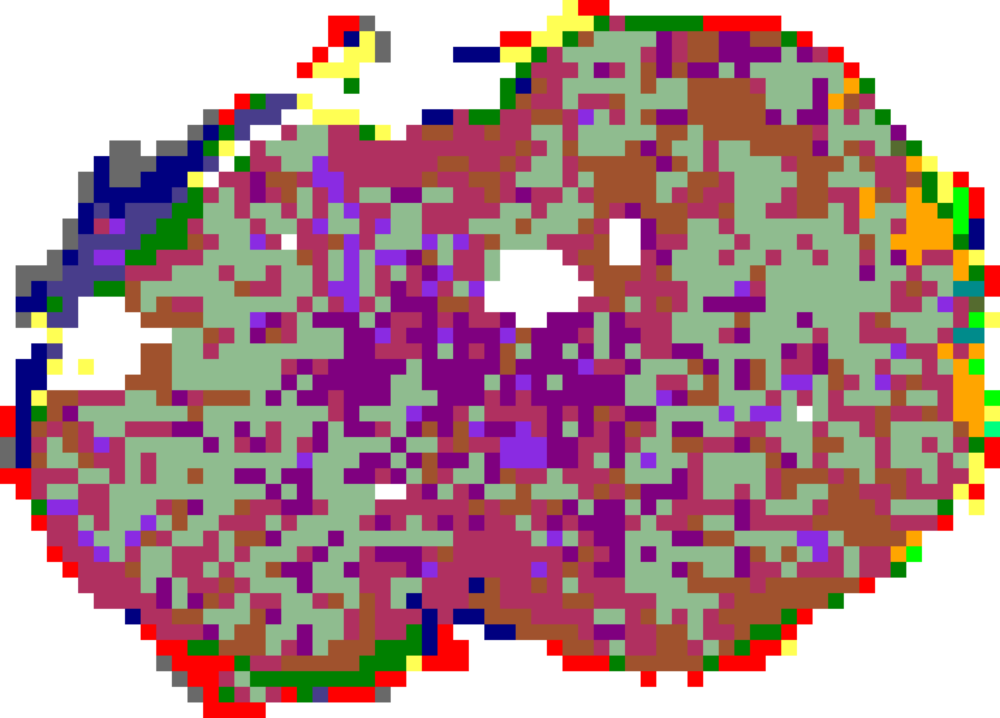

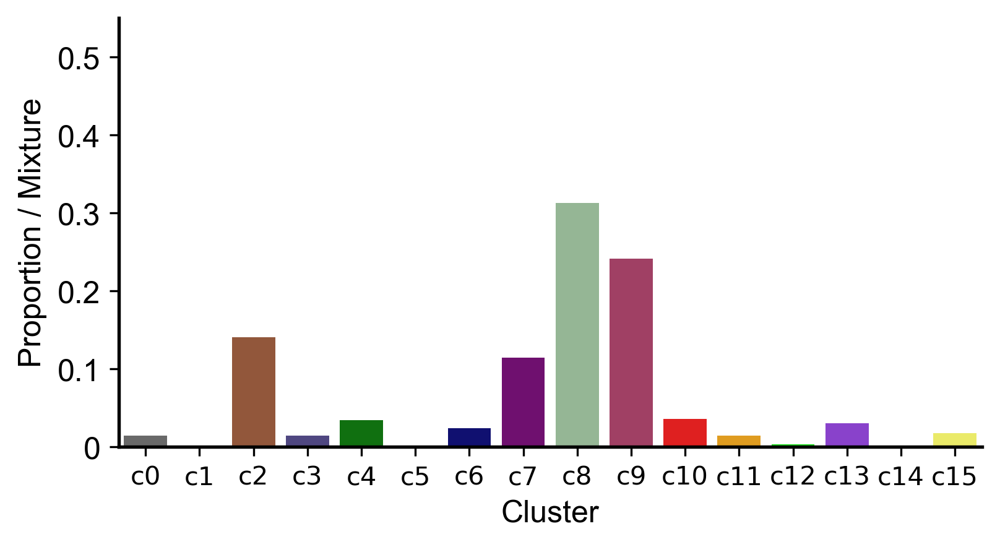

In [55]:
import h5py
import numpy as np
from PIL import Image, ImageDraw
from prototype_visualization_utils import get_default_cmap


h5_feats_fpath = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\uniextracted_mag5x_patch224_fp\feats_h5\FA 57B.h5'

h5 = h5py.File(h5_feats_fpath, 'r')

coords = h5['coords'][:]
feats = torch.Tensor(h5['features'][:])
# patch_size = h5['coords'].attrs['patch_size']
patch_size = 224

### get PANTHER representation and GMM mixtures
with torch.inference_mode():
    info = panther_encoder.representation(feats.unsqueeze(dim=0))
    qqs = info['qq']
    out = info['repr']
    tokenizer = PrototypeTokenizer(out_type='allcat', p=16)
    mus, pis, sigmas = tokenizer.forward(out)
    mus = mus[0].detach().cpu().numpy()
    qq = qqs[0,:,:,0].cpu().numpy()
    global_cluster_labels = qq.argmax(axis=1)

# Get bounding box of full patch region
x_min, y_min = coords.min(axis=0)
coords -= np.array([x_min, y_min])  # Normalize to (0,0)
max_x, max_y = coords.max(axis=0) + patch_size
canvas_w, canvas_h = int(max_x), int(max_y)

# Create blank white canvas
canvas = Image.new('RGBA', (canvas_w, canvas_h), (255, 255, 255, 255))
draw = ImageDraw.Draw(canvas, 'RGBA')

# cmap = get_default_cmap(len(np.unique(global_cluster_labels)))
cmap = get_default_cmap(int(global_cluster_labels.max()) + 1)

alpha = 1
scale = 0.25  # Adjust as needed

# Draw rectangles
for (x, y), label in zip(coords, global_cluster_labels):
    color = cmap[label]
    rgba = color + (int(255 * alpha),)  # Add alpha
    draw.rectangle([x, y, x + patch_size, y + patch_size], fill=rgba)

# Resize for visualization
if scale < 1.0:
    canvas = canvas.resize((int(canvas_w * scale), int(canvas_h * scale)))
display(canvas)
display(get_mixture_plot(mus))

visualize patches per cluster

In [22]:
from collections import defaultdict
import random

cluster_to_coords = defaultdict(list)
for coord, label in zip(coords, global_cluster_labels):
    cluster_to_coords[label].append(coord)


with randomized selection of patches

In [51]:
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import torch
from prototype_visualization_utils import get_default_cmap
from mil_models.tokenizer import PrototypeTokenizer
import glob
import random

def visualize_cluster_patches_for_slide(
    h5_feats_fpath,
    patch_dir,
    panther_encoder,
    patch_size=224,
    max_patches_per_cluster=4,
    random_seed=None,
    save_path=None
):
    """
    Visualizes a few random patch examples from each prototype cluster for a single slide.

    Parameters:
    - h5_feats_fpath (str): path to the .h5 file with 'features' and 'coords'.
    - patch_dir (str): path to the directory containing .npy patches for the slide.
    - panther_encoder (torch.nn.Module): trained encoder that returns representation and qq.
    - patch_size (int): size of each square patch.
    - max_patches_per_cluster (int): number of patches to show per cluster.
    - random_seed (int or None): seed for reproducibility.
    - save_path (str or None): path to save the final image (optional).
    """
    if random_seed is not None:
        random.seed(random_seed)

    with h5py.File(h5_feats_fpath, 'r') as h5:
        coords = h5['coords'][:]
        feats = torch.Tensor(h5['features'][:])

    with torch.inference_mode():
        info = panther_encoder.representation(feats.unsqueeze(dim=0))
        qqs = info['qq']
        out = info['repr']
        tokenizer = PrototypeTokenizer(out_type='allcat', p=qqs.shape[2])
        tokenizer.forward(out)  # Optional
        qq = qqs[0, :, :, 0].cpu().numpy()
        global_cluster_labels = qq.argmax(axis=1)

    original_coords = coords.copy()
    samples_per_cluster = {}
    for label, (x, y) in zip(global_cluster_labels, original_coords):
        samples_per_cluster.setdefault(label, []).append((int(x), int(y)))

    n_clusters = len(samples_per_cluster)
    fig, axs = plt.subplots(n_clusters, max_patches_per_cluster, figsize=(max_patches_per_cluster * 3, n_clusters * 3))
    if n_clusters == 1:
        axs = np.expand_dims(axs, axis=0)

    # for row_idx, (cluster_id, coords_list) in enumerate(samples_per_cluster.items()):
    for row_idx, cluster_id in enumerate(sorted(samples_per_cluster.keys())):
        coords_list = samples_per_cluster[cluster_id]

        selected_coords = random.sample(coords_list, k=min(max_patches_per_cluster, len(coords_list)))
        for col_idx in range(max_patches_per_cluster):
        # for col_idx in range(max_patches_per_cluster): # not randomized
            ax = axs[row_idx][col_idx]
            if col_idx >= len(selected_coords):
                ax.axis('off')
                continue

            x, y = selected_coords[col_idx]
            pattern = f'*_x{x}_y{y}.npy'
            matches = glob.glob(os.path.join(patch_dir, pattern))

            if not matches:
                print(f"⚠️ Missing patch ending with _x{x}_y{y}.npy")
                ax.axis('off')
                continue

            patch = np.load(matches[0])
            ax.imshow(patch.astype(np.uint8))
            ax.set_title(f'Cluster {cluster_id}' if col_idx == 0 else "")
            ax.axis('off')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300)
    plt.show()


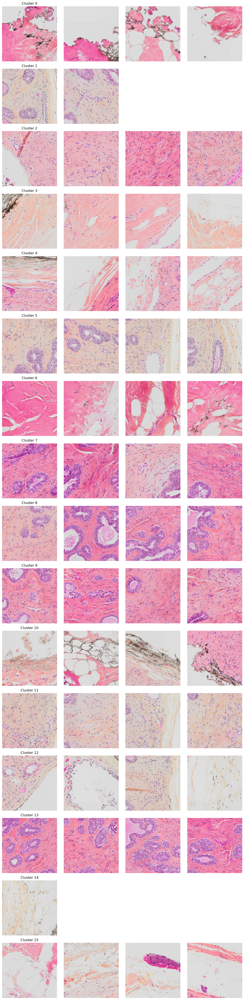

In [56]:
visualize_cluster_patches_for_slide(
    h5_feats_fpath=r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\uniextracted_mag5x_patch224_fp\feats_h5\FA 57B.h5',
    patch_dir=r'C:\Users\Vivian\Documents\CONCH\all_patches\patches_5x\20x\FA\FA 57B',
    panther_encoder=panther_encoder,
    patch_size=224,
    max_patches_per_cluster=4,
    random_seed=42  # or set a seed like 42 if needed
)


og code to visualize heatmap on wsi


Creating heatmap for: 
Top Left:  (0, 0) Bottom Right:  (103598, 86210)
Width: 3237, Height: 2694
Original Patch Size / Scaled Patch Size: (512, 512) / [16 16]
vis_level:  2
downsample:  32
region_size:  (3237, 2694)
total of 22312 patches


100%|██████████| 22312/22312 [00:01<00:00, 14284.04it/s]


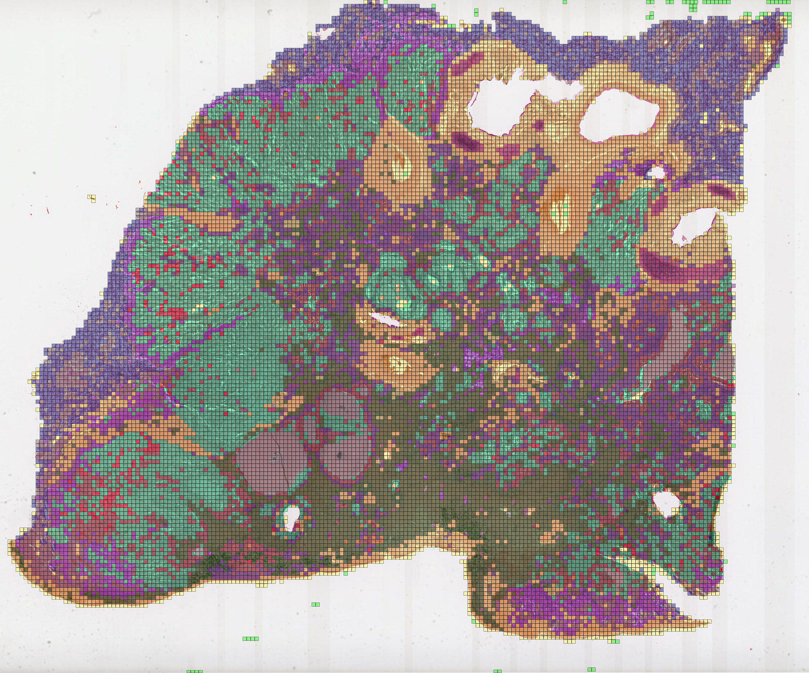

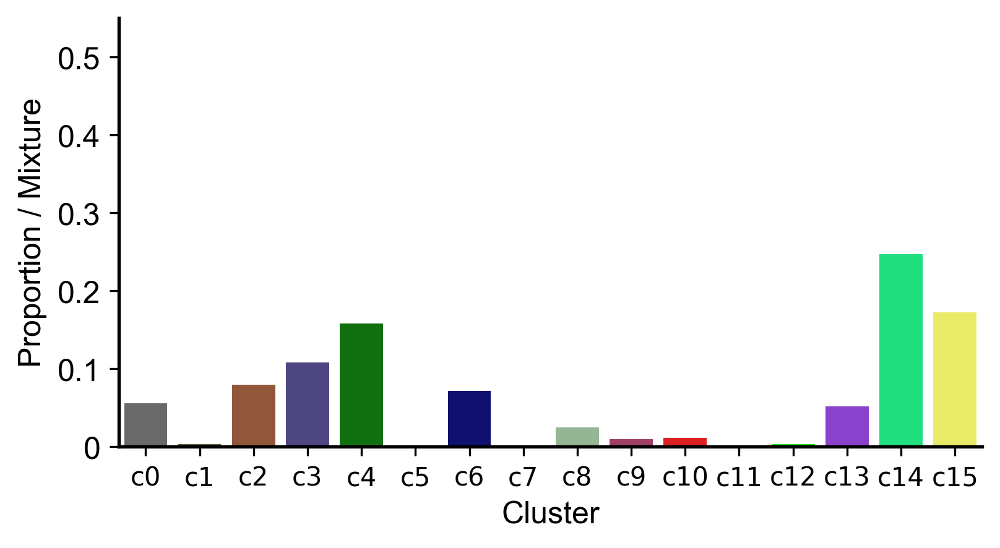

None

In [119]:
### open your WSI and features
slide_id = 'TCGA-93-8067-01Z-00-DX1.325d0cd5-9bb5-4f51-a197-75d3c3d19aaf'
slide_fpath = f'path/to/tcga_lung/{slide_id}.svs'
h5_feats_fpath = f'path/to/tcga_lung_feats/{slide_id}.h5'

wsi = openslide.open_slide(slide_fpath)
h5 = h5py.File(h5_feats_fpath, 'r')

coords = h5['coords'][:]
feats = torch.Tensor(h5['features'][:])
patch_size = h5['coords'].attrs['patch_size']

### get PANTHER representation and GMM mixtures
with torch.inference_mode():
    info = panther_encoder.representation(feats.unsqueeze(dim=0))
    qqs = info['qq']
    out = info['repr']
    tokenizer = PrototypeTokenizer(p=16)
    mus, pis, sigmas = tokenizer.forward(out)
    mus = mus[0].detach().cpu().numpy()
    qq = qqs[0,:,:,0].cpu().numpy()
    global_cluster_labels = qq.argmax(axis=1)

### Visualize the categorical heatmap and the GMM mixtures
cat_map = visualize_categorical_heatmap(
    wsi,
    coords, 
    global_cluster_labels, 
    label2color_dict=get_default_cmap(16),
    vis_level=wsi.get_best_level_for_downsample(128),
    patch_size=(patch_size, patch_size),
    alpha=0.4,
)

display(cat_map.resize((cat_map.width//4, cat_map.height//4)))
display(get_mixture_plot(mus))

### Additional Examples of Prototypical Assignment Maps
- Shown below are additional examples of prototypical assignment maps in the test set of the NSCLC subtyping task. We show both exemplar and failure cases in PANTHER. Within `./tcga_lung_categorical_maps.zip` are visualizations for all test TCGA WSIs in the NSCLC subtyping task.
- **Limitations**: As unsupervised slide representations in PANTHER are created using non-parametric techniques such as K-Means Clustering and GMMs (which rely on Euclidean distance or dot product to compare embeddings), dependent on the severity of distribution shift between the train and test distributions (due to variable H&E stain variability), prototype assignment for certain WSIs may lead to results in which all patches are assigned to a single prototype. This is exemplified in TCGA which has site-specific biases, and is thus an important consideration when considering using PANTHER (or any non-parametric approach) for morphological feature discovery. Additionally, when clustering over a WSI dataset composed of millions to billions of patches, wclustering with only C=16 clusters will likely underfit the dataset, and also lead to collapse of all patches in a WSI falling under a single prototype.

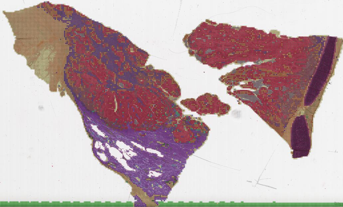

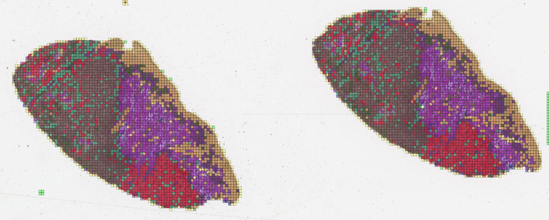

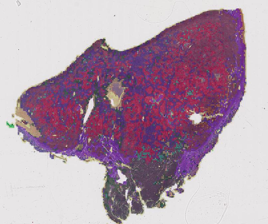

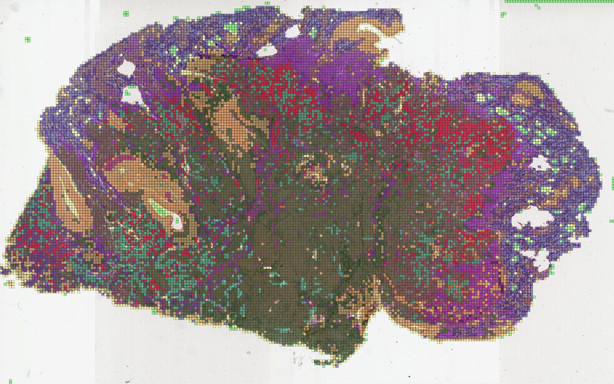

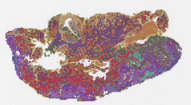

...

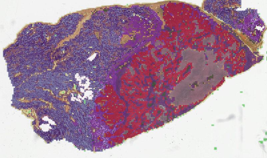

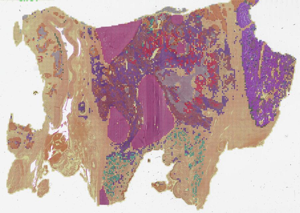

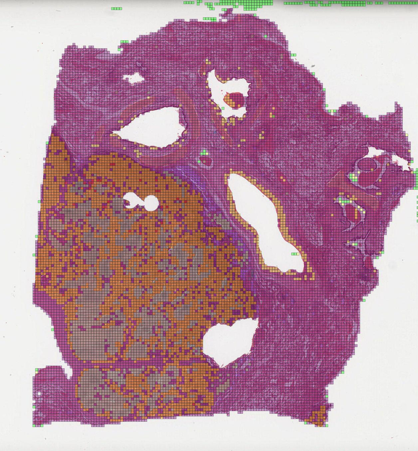

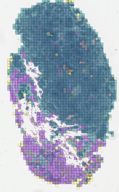

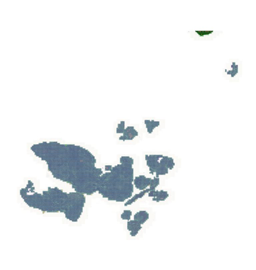